In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [11]:
!pip install keract

# Download Train and Test data

In [15]:
# Download and unzip training data
os.chdir('/content')
!wget http://vllab.ucmerced.edu/wlai24/LapSRN/results/SR_training_datasets.zip
!wget http://vllab.ucmerced.edu/wlai24/LapSRN/results/SR_testing_datasets.zip

!unzip SR_training_datasets
!unzip SR_testing_datasets

--2020-02-21 13:47:47--  http://vllab.ucmerced.edu/wlai24/LapSRN/results/SR_training_datasets.zip
Resolving vllab.ucmerced.edu (vllab.ucmerced.edu)... 169.236.184.69
Connecting to vllab.ucmerced.edu (vllab.ucmerced.edu)|169.236.184.69|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 90427393 (86M) [application/zip]
Saving to: ‘SR_training_datasets.zip’

SR_training_dataset 100%[===================>]  86.24M  14.7MB/s    in 6.9s    

2020-02-21 13:47:54 (12.5 MB/s) - ‘SR_training_datasets.zip’ saved [90427393/90427393]

--2020-02-21 13:47:56--  http://vllab.ucmerced.edu/wlai24/LapSRN/results/SR_testing_datasets.zip
Resolving vllab.ucmerced.edu (vllab.ucmerced.edu)... 169.236.184.69
Connecting to vllab.ucmerced.edu (vllab.ucmerced.edu)|169.236.184.69|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 317190619 (302M) [application/zip]
Saving to: ‘SR_testing_datasets.zip’

SR_testing_datasets 100%[===================>] 302.50M  43.7MB/s    in 

# Prepare Data
- Label folder containing images for training as 'Train'
- Label folder containing test images as 'Test'
- Run prepare_data.py to generate train and test h5 files

In [0]:
SR_FACTOR = 2
NUM_LAYER = 3
LOSS = 'mse'
OP_NAME = 'Adam'
OP_SIZE = '3e-4'
PATCH_SIZE = 32
LABEL_SIZE = 18
CONVOLUTION_SIZE = (PATCH_SIZE - LABEL_SIZE)//2

MODULE_PATH = '/content/drive/My Drive/project/super-resolution/SRCNN/'
DRIVE_PATH = '/content/drive/My Drive/project/super-resolution/SRCNN/SRCNN_RELU/'
import os

In [0]:
os.chdir(MODULE_PATH)
import prepare_data as pd

os.chdir('/content')

data_processor = pd.DataProcessor()
data_processor.change_path(data_path='/content/BSDS200/', test_path='/content/Set14/')
data_processor.change_factors(scale=SR_FACTOR, patch_size=PATCH_SIZE, label_size=LABEL_SIZE, conv_side=CONVOLUTION_SIZE, block_size=PATCH_SIZE)
data_processor.generate_data()

Writing train data ...
Writing test data ...


# NN Pipeline

In [4]:
try:
    %tensorflow_version 2.x
except:
    pass

import tensorflow as tf
from tensorflow.keras import layers
import os
import math
import numpy as np
from skimage.measure import compare_psnr
import matplotlib.pyplot as plt
import cv2

TensorFlow 2.x selected.


In [0]:
from tensorflow.keras import backend as K
def PSNR(y_true, y_pred):
    max_val = 1.0
    return tf.image.psnr(y_true, y_pred, max_val=max_val)

dependency = {
    'PSNR': PSNR
}

## Make training model


In [0]:
def make_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(128, (9, 9), input_shape=(PATCH_SIZE, PATCH_SIZE, 1)))
    model.add(layers.ReLU())
    model.add(layers.Conv2D(64, (3,3)))
    model.add(layers.ReLU())
    model.add(layers.Conv2D(1, (5, 5), activation='linear'))
    adam = tf.keras.optimizers.Adam(3e-4)

    model.compile(optimizer=adam,
                  loss='mse',
                  metrics=['mean_squared_error', PSNR])
    
    return model

In [0]:
def train(model, EPOCHS, BATCH_SIZE):
    data, label = pd.read_training_data("./train.h5")
    val_data, val_label = pd.read_training_data("./test.h5")

    # Make checkpoints
    checkpoint = tf.keras.callbacks.ModelCheckpoint("SRCNN_checkpoint.h5",
                    monitor='val_loss', verbose=1, save_best_only=True,
                    save_weights_only=False, mode='min')
    callbacks_list = [checkpoint]

    history = model.fit(data, label, batch_size=BATCH_SIZE,
                        validation_data=(val_data, val_label),
                        callbacks=callbacks_list,
                        shuffle=True,
                        epochs=EPOCHS)

    return history

In [0]:
BATCH_SIZE = 128
EPOCHS = 100
srcnn = make_model()
srcnn.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 24, 24, 128)       10496     
_________________________________________________________________
re_lu_4 (ReLU)               (None, 24, 24, 128)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 22, 22, 64)        73792     
_________________________________________________________________
re_lu_5 (ReLU)               (None, 22, 22, 64)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 18, 18, 1)         1601      
Total params: 85,889
Trainable params: 85,889
Non-trainable params: 0
_________________________________________________________________


In [0]:
history = train(srcnn, EPOCHS, BATCH_SIZE)

Train on 100800 samples, validate on 420 samples
Epoch 1/100
100224/100800 [============================>.] - ETA: 0s - loss: 0.0052 - mean_squared_error: 0.0052 - PSNR: 29.7491
Epoch 00001: val_loss improved from inf to 0.00375, saving model to SRCNN_checkpoint.h5
100800/100800 [==============================] - 6s 64us/sample - loss: 0.0052 - mean_squared_error: 0.0052 - PSNR: 29.7524 - val_loss: 0.0038 - val_mean_squared_error: 0.0038 - val_PSNR: 28.0952
Epoch 2/100
100480/100800 [============================>.] - ETA: 0s - loss: 0.0038 - mean_squared_error: 0.0038 - PSNR: 30.4263
Epoch 00002: val_loss improved from 0.00375 to 0.00375, saving model to SRCNN_checkpoint.h5
100800/100800 [==============================] - 6s 60us/sample - loss: 0.0038 - mean_squared_error: 0.0038 - PSNR: 30.4245 - val_loss: 0.0037 - val_mean_squared_error: 0.0037 - val_PSNR: 27.9976
Epoch 3/100
100224/100800 [============================>.] - ETA: 0s - loss: 0.0038 - mean_squared_error: 0.0038 - PSNR: 

## Save model


In [0]:
os.chdir(DRIVE_PATH)
name = 'SRCNN_X' + str(SR_FACTOR) + '_L' + str(NUM_LAYER) +'_P_Zero_E' + str(LOSS)
if not os.path.exists(name):
    os.mkdir(name)
os.chdir(name)

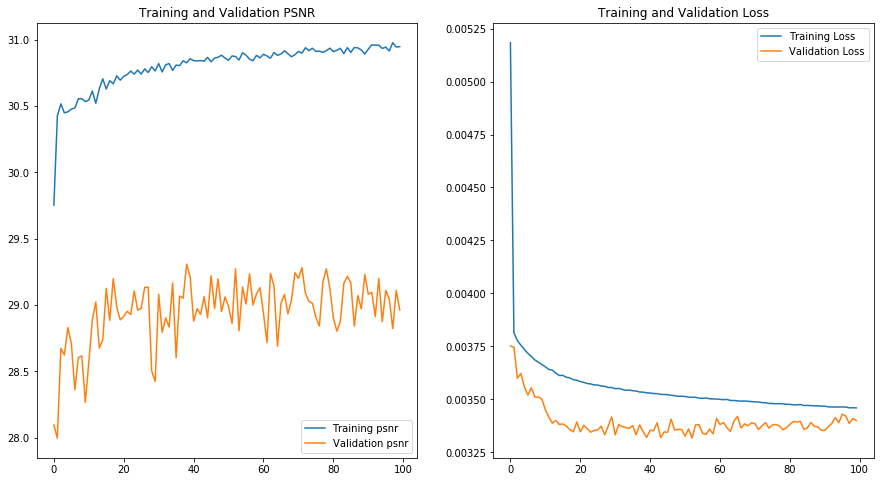

In [0]:
psnr = history.history['PSNR']
val_psnr = history.history['val_PSNR']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, psnr, label='Training psnr')
plt.plot(epochs_range, val_psnr, label='Validation psnr')
plt.legend(loc='lower right')
plt.title('Training and Validation PSNR')
#plt.savefig('psnr.png')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.savefig('mse.png')
plt.show()

In [0]:
import yaml
file_data = [{
    'optimizer_name': OP_NAME,
    'optimizer_size': OP_SIZE,
    'sr_factor': SR_FACTOR,
    'epoch': EPOCHS,
    'loss': LOSS,
    'batch_size': BATCH_SIZE,
    'training_image_size': '18x18',
    'interpolation': 'bicubic',
    'psnr_chanel': '(Y)CrCb',
    'train_path': PATCH_SIZE,
}]


with open(r'model_info.yaml', 'w') as file:
    documents = yaml.dump(file_data, file)

In [0]:
srcnn.save('train_model.h5')
from shutil import copyfile
dst = os.path.join(os.getcwd(), 'SRCNN_checkpoint.h5')
copyfile('/content/SRCNN_checkpoint.h5', dst)

'/content/drive/My Drive/project/super-resolution/SRCNN/SRCNN_RELU/SRCNN_X3_L3_P_Zero_Emse/SRCNN_checkpoint.h5'

# Super Resolve images

In [0]:
os.chdir('/content')

In [0]:
def predict_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(128, (9, 9), input_shape=(None, None, 1)))
    model.add(layers.ReLU())
    model.add(layers.Conv2D(64, (3,3)))
    model.add(layers.ReLU())
    model.add(layers.Conv2D(1, (5, 5), activation='linear'))
    adam = tf.keras.optimizers.Adam(3e-4)

    model.compile(optimizer=adam,
                  loss='mse',
                  metrics=['mean_squared_error', PSNR])
    
    return model

In [0]:
def predict(model, sr_factor, img_path, save_path):
    import cv2
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    im1 = img

    img = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    shape = img.shape
    Y_img = cv2.resize(img[:, :, 0], (shape[1] // sr_factor, shape[0] // sr_factor), cv2.INTER_CUBIC)
    Y_img = cv2.resize(Y_img, (shape[1], shape[0]), cv2.INTER_CUBIC)
    img[:, :, 0] = Y_img
    img = cv2.cvtColor(img, cv2.COLOR_YCrCb2BGR)
    im2 = img

    Y = np.zeros((1, img.shape[0], img.shape[1], 1), dtype=float)
    Y[0, :, :, 0] = Y_img.astype(float) / 255.
    pre = model.predict(Y, batch_size=1) * 255.
    pre[pre[:] > 255] = 255
    pre[pre[:] < 0] = 0
    pre = pre.astype(np.uint8)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    
    if CONVOLUTION_SIZE != 0:
        img[CONVOLUTION_SIZE: -CONVOLUTION_SIZE, CONVOLUTION_SIZE: -CONVOLUTION_SIZE, 0] = pre[0, :, :, 0]
    else:
        img[0:,0:,0] = pre[0, :, :, 0]

    img = cv2.cvtColor(img, cv2.COLOR_YCrCb2BGR)
    im3 = img
    print("im3 "+ str(im3.shape)+" im1 "+str(im1.shape))
    cv2.imwrite(save_path, im3)
     
    # psnr calculation:
    im = []
    im.append(cv2.cvtColor(im1, cv2.COLOR_RGB2BGR))
    im.append(cv2.cvtColor(im2, cv2.COLOR_RGB2BGR))
    im.append(cv2.cvtColor(im3, cv2.COLOR_RGB2BGR))

    im1 = cv2.cvtColor(im1, cv2.COLOR_BGR2YCrCb)[CONVOLUTION_SIZE: -CONVOLUTION_SIZE, CONVOLUTION_SIZE: -CONVOLUTION_SIZE, 0]
    im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2YCrCb)[CONVOLUTION_SIZE: -CONVOLUTION_SIZE, CONVOLUTION_SIZE: -CONVOLUTION_SIZE, 0]
    im3 = cv2.cvtColor(im3, cv2.COLOR_BGR2YCrCb)[CONVOLUTION_SIZE: -CONVOLUTION_SIZE, CONVOLUTION_SIZE: -CONVOLUTION_SIZE, 0]

    fig, axes = plt.subplots(1, 3, figsize=(20, 20))
    for i, ax in enumerate(axes):
        ax.set_title(i)
        ax.set_xlabel(math.inf if cv2.PSNR(im[0], im[i]) > 300 else cv2.PSNR(im[0], im[i]))
        ax.imshow(im[i])

   

In [9]:
predict_srcnn = predict_model()
predict_srcnn.summary()
weights_file = 'SRCNN_checkpoint.h5'
predict_srcnn.load_weights(weights_file)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, None, None, 128)   10496     
_________________________________________________________________
re_lu (ReLU)                 (None, None, None, 128)   0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, None, None, 64)    73792     
_________________________________________________________________
re_lu_1 (ReLU)               (None, None, None, 64)    0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, None, None, 1)     1601      
Total params: 85,889
Trainable params: 85,889
Non-trainable params: 0
_________________________________________________________________


## Save test model

In [0]:
os.chdir(DRIVE_PATH + name)
predict_srcnn.save('test_model.h5')

# Visualize features and filters



conv2d (1, 248, 248, 128) 
re_lu (1, 248, 248, 128) 
conv2d_1 (1, 246, 246, 64) 
re_lu_1 (1, 246, 246, 64) 
conv2d_2 (1, 242, 242, 1) 


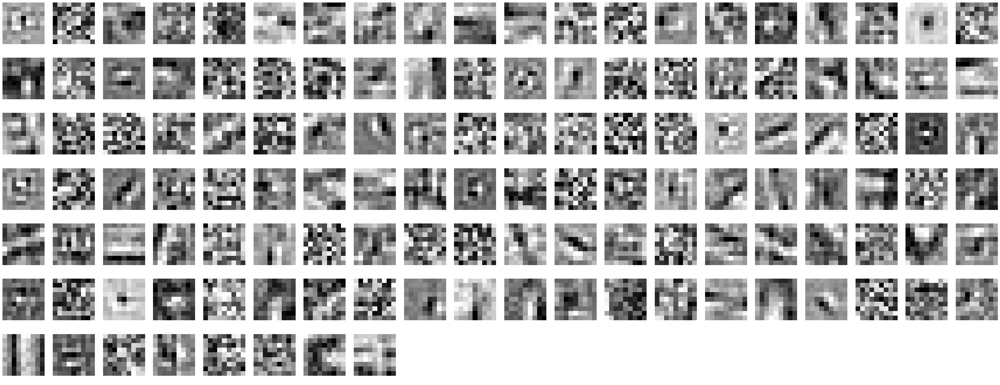

In [18]:
import keract, cv2
image = cv2.imread('/content/Set5/butterfly.png', cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
y_image = image[:, :, 0]
y_image = np.reshape(y_image, (1, image.shape[0], image.shape[1], 1))

activations = keract.get_activations(predict_srcnn, y_image)
keract.display_activations(activations, cmap='gray', save=True)

filters, _ = predict_srcnn.layers[0].get_weights()
num_filters = filters.shape[3]
def save_filters(filters, num_filters):
    import math
    ncols = 20
    nrows = math.ceil(num_filters / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(50, 20))
    for i in range(nrows * ncols):
        if i < num_filters:
            axes.flat[i].imshow(filters[:, :, 0, i], cmap='gray')
        axes.flat[i].axis('off')
    fig.subplots_adjust(hspace=0)
    plt.savefig('filters.png')
save_filters(filters, num_filters)

In [0]:
# Load model
#os.chdir(DRIVE_PATH + name)
#predict_srcnn = tf.keras.models.load_model('test_model.h5', custom_objects=dependency)

In [0]:
folder = '/content/Set5/'
if not os.path.exists('Set5'):
    os.mkdir('Set5')
save_folder = os.path.join(os.getcwd(),'Set5/')  
for file in os.listdir(folder):
    path = folder + file
    save_path = save_folder + file
    predict(model=predict_srcnn, sr_factor=SR_FACTOR, img_path=path, save_path=save_path)

Output hidden; open in https://colab.research.google.com to view.

im3 (362, 500, 3) im1 (362, 500, 3)
im3 (288, 352, 3) im1 (288, 352, 3)
im3 (276, 276, 3) im1 (276, 276, 3)
im3 (391, 586, 3) im1 (391, 586, 3)
im3 (512, 768, 3) im1 (512, 768, 3)
im3 (288, 352, 3) im1 (288, 352, 3)
im3 (361, 250, 3) im1 (361, 250, 3)
im3 (512, 512, 3) im1 (512, 512, 3)
im3 (576, 720, 3) im1 (576, 720, 3)
im3 (656, 529, 3) im1 (656, 529, 3)
im3 (512, 512, 3) im1 (512, 512, 3)
im3 (512, 512, 3) im1 (512, 512, 3)
im3 (512, 512, 3) im1 (512, 512, 3)
im3 (480, 500, 3) im1 (480, 500, 3)


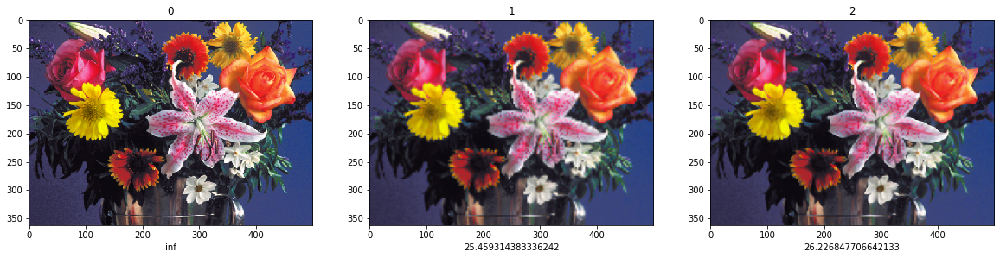

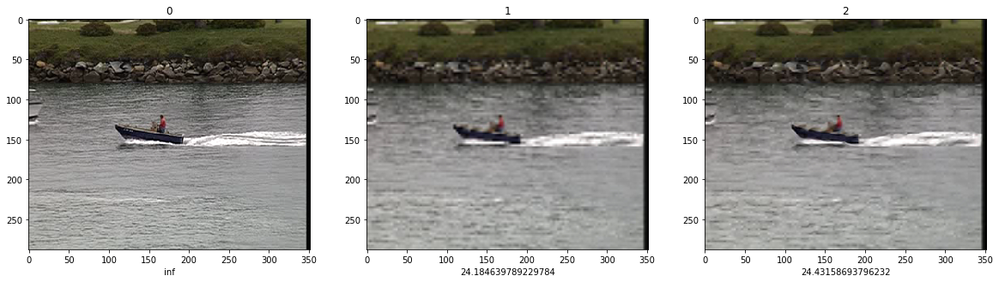

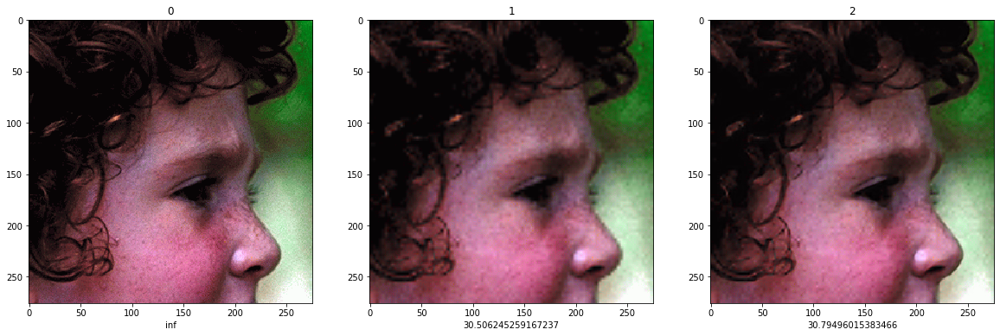

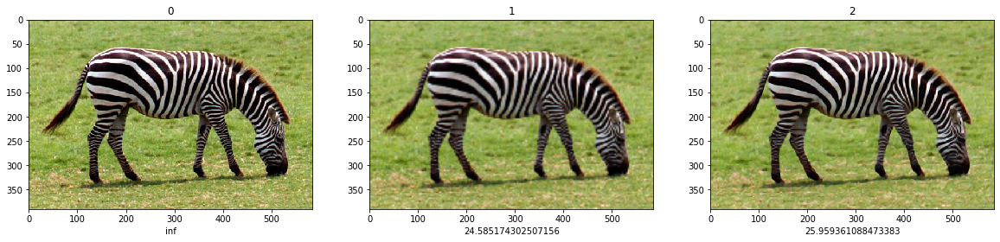

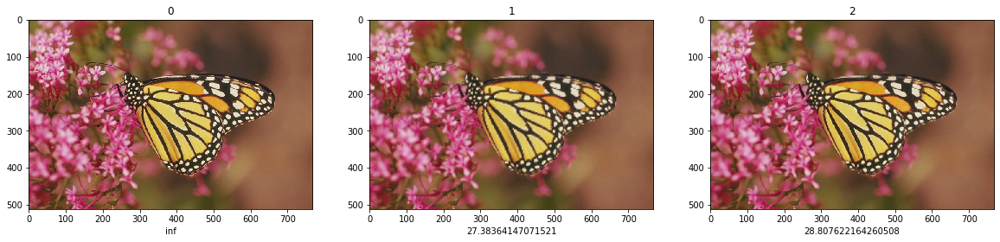

...

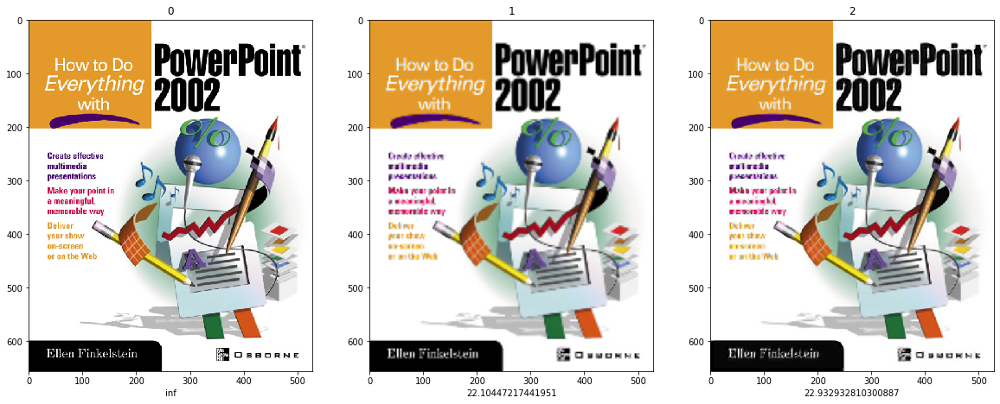

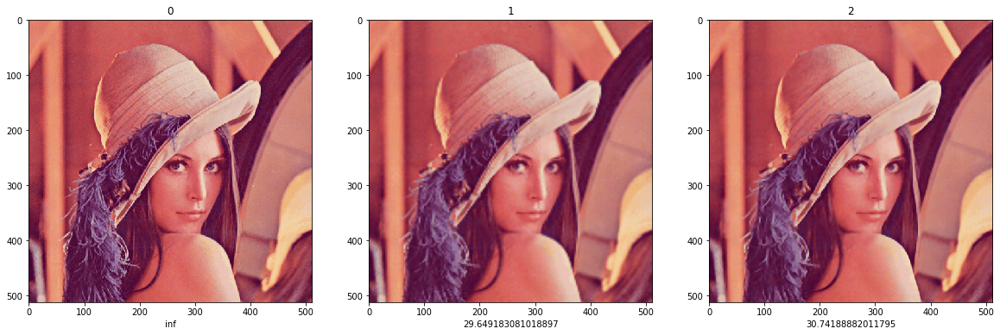

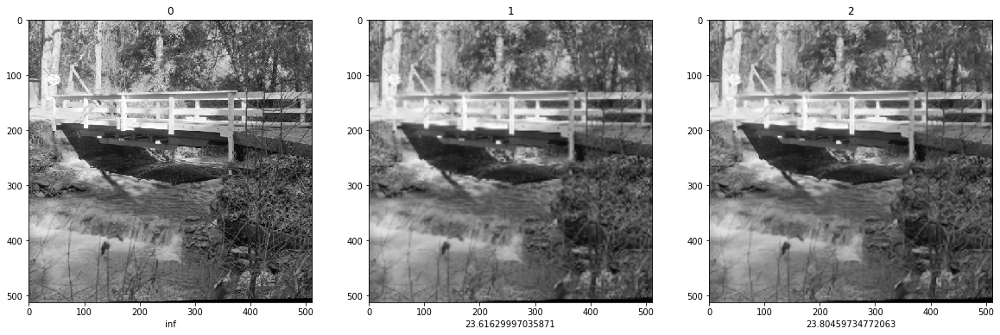

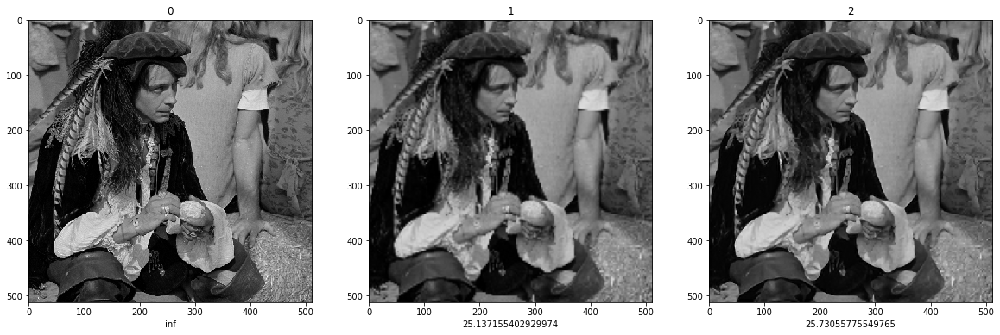

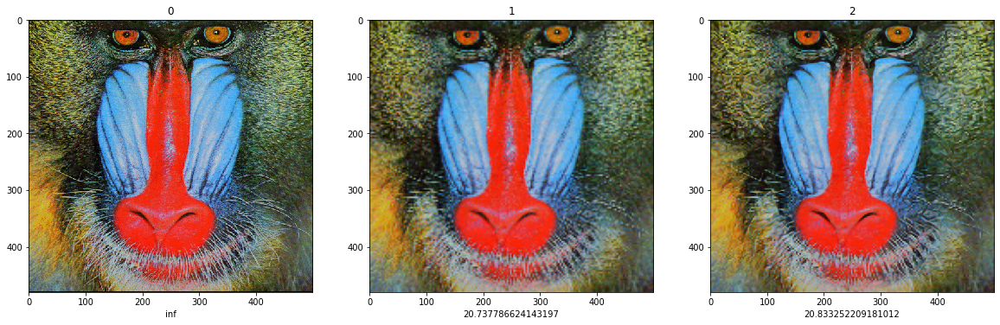

In [0]:
folder = '/content/Set14/'
if not os.path.exists('Set14'):
    os.mkdir('Set14')
save_folder = os.path.join(os.getcwd(),'Set14/')  
for file in os.listdir(folder):
    path = folder + file
    save_path = save_folder + file
    predict(predict_srcnn, sr_factor=SR_FACTOR, img_path=path, save_path=save_path)